In [4]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import StandardScaler
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.seasonal import seasonal_decompose
from functools import reduce
from statsmodels.tsa.stattools import adfuller

import xgboost as xgb
import lightgbm as lgb
# from sklearn.ensemble import StackingRegressor
from mlxtend.regressor import StackingCVRegressor
from sklearn.linear_model import Ridge  # мета-модель
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

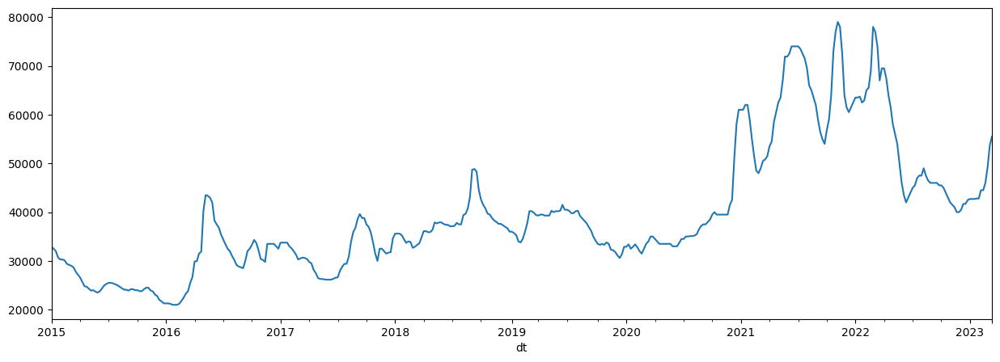

,dt,Импорт цемента ЖД,Экспорт цемента ЖД,Отгрузка цемента хоппер ЖД,Отгрузка цемента остальные ЖД,Производство цемента,Импорт цемента,Экспорт цемента,Потребление цемента,Отгрузка цемента,Цена цемента с НДС,Цена цемента без НДС,Производство бетона РФ,Производство бетона МО,Производство бетона СПБ
0,2021-04-30,40.751000,27.530000,987.54000,201.757000,2.3891,52.331737,31.491150,2.290941,1.189297,3769.20,4968.10,1.919781,223.405,198.589
1,2021-05-31,69.979000,43.423000,1071.83200,256.733000,2.7115,79.639340,50.164150,2.670775,1.328565,3745.23,4822.46,2.059197,293.411,162.181
2,2021-06-30,105.525000,58.226000,1495.35100,446.953000,3.8468,125.590100,64.990750,3.984199,1.942304,3790.64,5299.51,2.837929,424.112,254.893
3,2021-07-31,125.093000,88.930000,1754.57600,573.133000,4.8559,182.176201,105.965900,4.933510,2.327709,3853.30,5031.96,3.302281,492.623,301.091
4,2021-08-31,124.438000,112.454000,1859.54900,659.929000,5.7240,193.681060,141.093150,5.762688,2.519478,3915.07,5240.72,3.788132,562.724,303.961
5,2021-09-30,125.669000,143.621000,1998.19100,813.518000,6.4010,217.010540,171.180400,6.674830,2.811709,3966.72,5163.41,4.296160,580.444,345.532
6,2021-10-31,122.030000,129.403000,1889.19600,989.297000,6.6908,232.288189,153.850060,6.881838,2.878493,4035.60,5426.48,5.773625,1082.764,373.798
7,2021-11-30,111.634000,120.585000,1844.53400,928.144000,6.6463,209.976386,142.032550,6.780344,2.772678,4097.58,5323.64,5.943797,1115.723,380.008
8,2021-12-31,97.011000,112.507000,1689.87300,789.147000,6.1945,178.660367,132.239750,6.386421,2.479020,4172.67,5397.43,5.965973,1090.623,361.167
9,2022-01-31,105.816000,102.736000,1778.07200,600.256000,6.0097,201.859649,119.818990,6.036641,2.378328,4231.15,5480.04,5.608766,1085.405,334.512


In [5]:
train_xlsx = pd.read_excel("data/train.xlsx")
test_xlsx = pd.read_excel("data/test.xlsx")
gruz = pd.read_excel("data/Грузоперевозки.xlsx")
rynok_data = pd.read_excel("data/Данные рынка стройматериалов.xlsx")
lme = pd.read_excel("data/Индекс LME.xlsx")
macro_pok = pd.read_excel("data/Макропоказатели.xlsx")
pok_ryn = pd.read_excel("data/Показатели рынка металла.xlsx")
topl = pd.read_excel("data/Топливо.xlsx")
syrye_price = pd.read_excel("data/Цены на сырье.xlsx")

train_xlsx.to_csv("csvs/train.csv", sep=",", index = False)
test_xlsx.to_csv("csvs/test.csv", sep=",", index = False)
gruz.to_csv("csvs/cargo.csv", sep=",", index = False)
rynok_data.to_csv("csvs/market_data.csv", sep=",", index = False)
lme.to_csv("csvs/index_LME.csv", sep=",", index = False)
macro_pok.to_csv("csvs/macro.csv", sep=",", index = False)
pok_ryn.to_csv("csvs/metal_market.csv", sep=",", index = False)
topl.to_csv("csvs/fuel.csv", sep=",", index = False)
syrye_price.to_csv("csvs/material_price.csv", sep=",", index = False)

train = pd.read_csv("csvs/train.csv")
test = pd.read_csv("csvs/test.csv")

cargo = pd.read_csv("csvs/cargo.csv")
market_data = pd.read_csv("csvs/market_data.csv")
index_LME = pd.read_csv("csvs/index_LME.csv")
macro = pd.read_csv("csvs/macro.csv")
metal_market = pd.read_csv("csvs/metal_market.csv")
fuel = pd.read_csv("csvs/fuel.csv")
material_price = pd.read_csv("csvs/material_price.csv")

add_data = [
    cargo,
    market_data,
    index_LME,
    macro,
    metal_market,
    fuel,
    material_price,
]

train = pd.concat([train, test])

train['dt'] = pd.to_datetime(train['dt'])
train = train.set_index('dt')

# print(train["Цена на арматуру"])

train['Цена на арматуру'].plot(figsize=(15, 5))
plt.show()

# additional_data = pd.read_excel('additional_data.xlsx')  # если есть

# Просмотр первых строк
# print(train.head())
# print(train.info())
(rynok_data.head(30))

<Axes: title={'center': 'Остаток'}, xlabel='dt'>

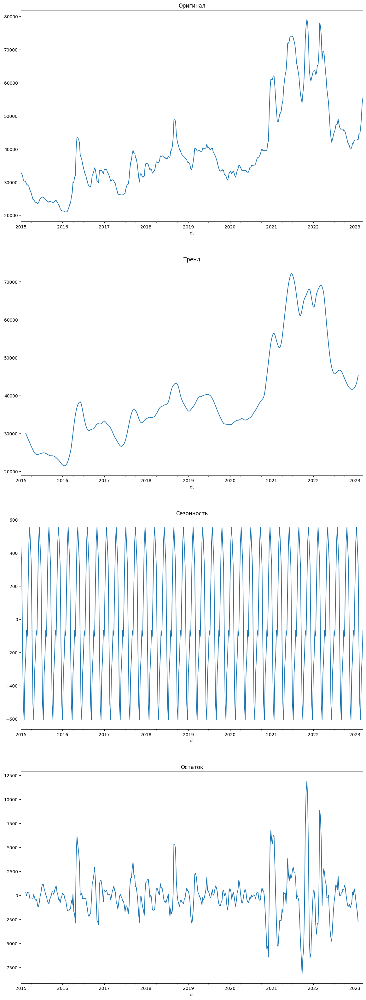

In [6]:
fig, ax = plt.subplots(nrows=4, ncols=1, figsize=(14, 40))
decompose = seasonal_decompose(train['Цена на арматуру'], period=12)

ax[0].set_title('Оригинал')
ax[1].set_title('Тренд')
ax[2].set_title('Сезонность')
ax[3].set_title('Остаток')

decompose.observed.plot(ax=ax[0])
decompose.trend.plot(ax=ax[1])
decompose.seasonal.plot(ax=ax[2])
decompose.resid.plot(ax=ax[3])

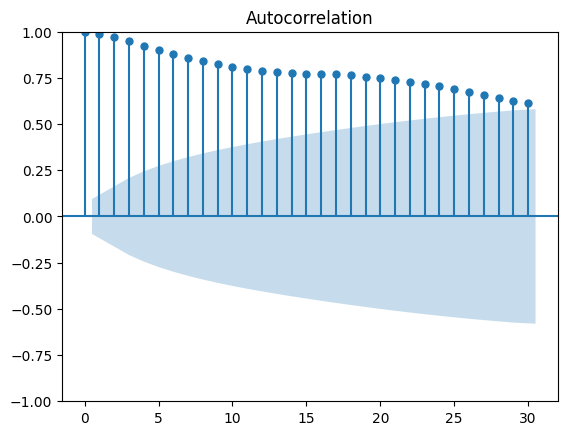

In [7]:
# Допустим, у тебя есть датафрейм df с колонкой 'price'
plot_acf(train['Цена на арматуру'], lags=30)  # Смотрим автокорреляцию на 30 лагов
plt.show()

In [8]:
print(cargo.head(), '\n\n\n',
market_data.head(), '\n\n\n',
index_LME.head(), '\n\n\n',
macro.head(), '\n\n\n',
metal_market.head(), '\n\n\n',
fuel.head(), '\n\n\n',
material_price.head()) 

           dt  Индекс стоимости грузоперевозок
0  2017-09-06                             1000
1  2017-09-13                              991
2  2017-09-20                              992
3  2017-09-27                              979
4  2017-10-04                              985 


            dt  Импорт цемента ЖД  Экспорт цемента ЖД  \
0  2021-04-30             40.751              27.530   
1  2021-05-31             69.979              43.423   
2  2021-06-30            105.525              58.226   
3  2021-07-31            125.093              88.930   
4  2021-08-31            124.438             112.454   

   Отгрузка цемента хоппер ЖД  Отгрузка цемента остальные ЖД  \
0                     987.540                        201.757   
1                    1071.832                        256.733   
2                    1495.351                        446.953   
3                    1754.576                        573.133   
4                    1859.549                        659.

In [9]:
def rename_date_column(df):
    # приведение дат к названию 'dt'
    for col in df.columns:
        print(col)
        if col.lower() in ['dt', 'date', 'дата']:  
            df = df.rename(columns={col: 'dt'}, inplace=True) 
            # break  
    return df

for data in add_data:
    data = rename_date_column(data)
print(index_LME.head())
train = train.reset_index()
# train_final = rename_date_column(train_final)
# market_final = rename_date_column(market_final)
# macro_final = rename_date_column(macro_final)
# raw_final = rename_date_column(raw_final)


dt
Индекс стоимости грузоперевозок
dt
Импорт цемента ЖД
Экспорт цемента ЖД
Отгрузка цемента хоппер ЖД
Отгрузка цемента остальные ЖД
Производство цемента
Импорт цемента
Экспорт цемента
Потребление цемента
Отгрузка цемента
Цена цемента с НДС
Цена цемента без НДС
Производство бетона РФ
Производство бетона МО
Производство бетона СПБ
дата
цена
dt
Базовый индекс потребительских цен на товары и услуги
Ключевая ставка
Курс доллара
dt
Производство арматуры Сортовой прокат_Арматура
Производство арматуры Сортовой прокат_Катанка
Производство арматуры Сортовой прокат_Прутки прочие
Производство сырья ЖРС_Агломерат
Производство сырья ЖРС_Аглоруда
Производство сырья ЖРС_Концентрат
Производство сырья ЖРС_Концентрат для дообогащения
Производство сырья ЖРС_Окатыши
Производство сырья Кокс_Кокс валовый
Производство сырья Концентрат коксующегося угля_Жирные
Производство сырья Концентрат коксующегося угля_Коксовые
Производство сырья Концентрат коксующегося угля_Отощающие
Производство сырья Металлизованная пр

In [10]:
train['dt'] = pd.to_datetime(train['dt'])
print(f"Train: {train['dt'].min()} - {train['dt'].max()}")

cargo['dt'] = pd.to_datetime(cargo['dt'], format='%Y-%m-%d')
print(f"Cargo: {cargo['dt'].min()} - {cargo['dt'].max()}")

fuel['dt'] = pd.to_datetime(fuel['dt'], format='%Y-%m-%d')
print(f"Market data: {fuel['dt'].min()} - {fuel['dt'].max()}")

index_LME['dt'] = pd.to_datetime(index_LME['dt'], format='%Y-%m-%d')
print(f"Macro: {index_LME['dt'].min()} - {index_LME['dt'].max()}")

macro['dt'] = pd.to_datetime(macro['dt'], format='%Y-%m-%d')
print(f"Raw: {macro['dt'].min()} - {macro['dt'].max()}")

market_data['dt'] = pd.to_datetime(market_data['dt'], format='%Y-%m-%d')
print(f"Raw: {market_data['dt'].min()} - {market_data['dt'].max()}")

material_price['dt'] = pd.to_datetime(material_price['dt'], format='%Y-%m-%d')
print(f"Raw: {material_price['dt'].min()} - {material_price['dt'].max()}")

metal_market['dt'] = pd.to_datetime(metal_market['dt'], format='%Y-%m-%d')
print(f"Raw: {metal_market['dt'].min()} - {metal_market['dt'].max()}")

# test['dt'] = pd.to_datetime(test['dt'], format='%Y-%m-%d')
# print(f"Raw: {test['dt'].min()} - {test['dt'].max()}")


Train: 2015-01-05 00:00:00 - 2023-03-13 00:00:00
Cargo: 2017-09-06 00:00:00 - 2023-06-14 00:00:00
Market data: 2017-02-28 00:00:00 - 2023-05-31 00:00:00
Macro: 2021-02-12 00:00:00 - 2023-03-27 00:00:00
Raw: 2016-01-31 00:00:00 - 2023-06-16 00:00:00
Raw: 2021-04-30 00:00:00 - 2023-04-30 00:00:00
Raw: 2015-02-09 00:00:00 - 2023-03-13 00:00:00
Raw: 2016-03-31 00:00:00 - 2023-03-31 00:00:00


In [11]:
# CHMF_stock['dt'] = pd.to_datetime(CHMF_stock['dt'], format='%m/%d/%Y')
# MAGN_stock['dt'] = pd.to_datetime(MAGN_stock['dt'], format='%d.%m.%Y')
# NLMK_stock['dt'] = pd.to_datetime(NLMK_stock['dt'], format='%m/%d/%Y')

# print(CHMF_stock['dt'])

In [12]:
index_LME.dtypes

dt      datetime64[ns]
цена            object
dtype: object

In [13]:
cargo_week = cargo.set_index('dt').resample('W-MON').mean().reset_index()
market_data_week = market_data.set_index('dt').resample('W-MON').mean().reset_index()
index_LME_week = index_LME.set_index('dt').resample('W-MON').mean(numeric_only=True).reset_index()
macro_week = macro.set_index('dt').resample('W-MON').mean().reset_index()
metal_market_week = metal_market.set_index('dt').resample('W-MON').mean().reset_index()
fuel_week = fuel.set_index('dt').resample('W-MON').mean().reset_index()
material_price_week = material_price.set_index('dt').resample('W-MON').mean().reset_index()

# CHMF_stock.set_index('dt').resample('W-MON').mean(numeric_only=True).reset_index()
# MAGN_stock.set_index('dt').resample('W-MON').mean(numeric_only=True).reset_index()
# NLMK_stock.set_index('dt').resample('W-MON').mean(numeric_only=True).reset_index()

In [14]:
min_date = max(train['dt'].min(), 
               market_data_week['dt'].min(), 
               index_LME_week['dt'].min(), 
               macro_week['dt'].min(),
               metal_market_week['dt'].min(),
               fuel_week['dt'].min(),
               material_price_week['dt'].min(),
            #    CHMF_stock['dt'].min(),
            #    MAGN_stock['dt'].min(),
            #    NLMK_stock['dt'].min()
               )   
print(min_date)
max_date = min(train['dt'].max(), 
               market_data_week['dt'].max(), 
               index_LME_week['dt'].max(), 
               macro_week['dt'].max(),
               metal_market_week['dt'].max(),
               fuel_week['dt'].max(),
               material_price_week['dt'].max(),
            #    CHMF_stock['dt'].max(),
            #    MAGN_stock['dt'].max(),
            #    NLMK_stock['dt'].max()
               )   
print(max_date)

2021-05-03 00:00:00
2023-03-13 00:00:00


In [15]:
train_final = train[(train['dt'] >= min_date) & (train['dt'] <= max_date)].reset_index(drop=True)
market_final = market_data_week[(market_data_week['dt'] >= min_date) & (market_data_week['dt'] <= max_date)].reset_index(drop=True)
index_LME_final = index_LME_week[(index_LME_week['dt'] >= min_date) & (index_LME_week['dt'] <= max_date)].reset_index(drop=True)
macro_final = macro_week[(macro_week['dt'] >= min_date) & (macro_week['dt'] <= max_date)].reset_index(drop=True)
metal_market_final = metal_market_week[(metal_market_week['dt'] >= min_date) & (metal_market_week['dt'] <= max_date)].reset_index(drop=True)
fuel_final = fuel_week[(fuel_week['dt'] >= min_date) & (fuel_week['dt'] <= max_date)].reset_index(drop=True)
material_price_final = material_price_week[(material_price_week['dt'] >= min_date) & (material_price_week['dt'] <= max_date)].reset_index(drop=True)

# CHMF_stock_final = CHMF_stock[(CHMF_stock['dt'] >= min_date) & (CHMF_stock['dt'] <= max_date)].reset_index(drop=True)
# MAGN_stock_final = MAGN_stock[(MAGN_stock['dt'] >= min_date) & (MAGN_stock['dt'] <= max_date)].reset_index(drop=True)
# NLMK_stock_final = NLMK_stock[(NLMK_stock['dt'] >= min_date) & (NLMK_stock['dt'] <= max_date)].reset_index(drop=True)

In [16]:


dfs = [train_final, market_final, macro_final, 
       index_LME_final, macro_final, metal_market_final, 
       fuel_final, material_price_final,] 
       # CHMF_stock_final, 
       # MAGN_stock_final, NLMK_stock_final]
df_merged = reduce(lambda left, right: pd.merge(left, right, on='dt', how='inner'), dfs)
# df_merged = df_merged.drop(columns=[' '])
df_merged.set_index('dt', inplace=True)
df_merged.index = df_merged.index.date

df_merged.to_csv('df_merged.csv')


In [17]:
df_merged.head()

,Цена на арматуру,Импорт цемента ЖД,Экспорт цемента ЖД,Отгрузка цемента хоппер ЖД,Отгрузка цемента остальные ЖД,Производство цемента,Импорт цемента,Экспорт цемента,Потребление цемента,Отгрузка цемента,...,"Лом_3А, РФ FCA ж/д Свердловская обл, руб./т, без НДС","Чугун_CFR Турция, $/т","ЖРС_Средневзвешенная цена окатыши Fe 62-65,5%, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена концентрат Fe 64-68%, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена аглоруда Fe 52-60%, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена за 1 % Fe в аглоруде, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена за 1 % Fe в концентрате, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена за 1 % Fe в окатыши, Россия FCA руб./т, без НДС","ЖРС_Украинский концентрат Fe 65-68%, DAP граница Украины с Европой, $/т","ЖРС_Украинские окатыши Fe 65-66%, DAP граница Украины с Европой, $/т"
2021-05-03,62500,40.751,27.530,987.540,201.757,2.3891,52.331737,31.49115,2.290941,1.189297,...,NaN,590.0,12736.0,10537.0,4439.0,70.0,160.0,205.0,183.5,222.5
2021-05-10,63500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,613.5,12736.0,10537.0,4439.0,70.0,160.0,205.0,183.5,222.5
2021-05-17,67000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,665.0,12736.0,10537.0,4439.0,70.0,160.0,205.0,183.5,222.5
2021-05-24,71900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,670.0,12736.0,10537.0,4439.0,70.0,160.0,205.0,183.5,222.5
2021-05-31,71900,69.979,43.423,1071.832,256.733,2.7115,79.639340,50.16415,2.670775,1.328565,...,NaN,667.5,13956.0,10279.0,4420.0,72.0,158.0,224.0,204.0,248.5


In [18]:
df_merged.describe()

,Цена на арматуру,Импорт цемента ЖД,Экспорт цемента ЖД,Отгрузка цемента хоппер ЖД,Отгрузка цемента остальные ЖД,Производство цемента,Импорт цемента,Экспорт цемента,Потребление цемента,Отгрузка цемента,...,"Лом_3А, РФ FCA ж/д Свердловская обл, руб./т, без НДС","Чугун_CFR Турция, $/т","ЖРС_Средневзвешенная цена окатыши Fe 62-65,5%, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена концентрат Fe 64-68%, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена аглоруда Fe 52-60%, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена за 1 % Fe в аглоруде, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена за 1 % Fe в концентрате, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена за 1 % Fe в окатыши, Россия FCA руб./т, без НДС","ЖРС_Украинский концентрат Fe 65-68%, DAP граница Украины с Европой, $/т","ЖРС_Украинские окатыши Fe 65-66%, DAP граница Украины с Европой, $/т"
count,98.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,23.000000,...,10.000000,98.000000,98.000000,98.000000,98.00000,98.000000,98.000000,98.000000,98.000000,98.000000
mean,56971.428571,108.757044,79.251911,1612.925246,558.149626,5.116713,173.872222,94.107821,5.185864,2.171078,...,21682.500000,529.204082,9955.775510,7161.571429,3429.77551,64.061224,108.683673,158.591837,129.010204,181.806122
std,12069.532230,33.758870,29.152016,307.093519,239.256053,1.411077,59.737498,35.857612,1.497077,0.530662,...,2435.623181,106.348068,4313.979182,3019.695837,1070.57584,14.601805,46.223482,70.357824,40.539721,39.274978
min,40000.000000,40.751000,27.530000,987.540000,201.757000,2.389100,52.331737,31.491150,2.290941,1.189297,...,18353.000000,380.000000,4507.000000,3405.000000,1950.00000,39.000000,51.000000,71.000000,83.000000,132.500000
25%,45500.000000,89.767374,60.402590,1445.335955,337.078888,3.975400,129.869581,70.247569,4.060481,1.830385,...,19426.750000,430.625000,5042.000000,4221.000000,2578.75000,53.000000,64.000000,78.000000,98.875000,150.500000
50%,57400.000000,111.634000,75.647687,1722.141410,573.133000,5.710500,178.660367,85.236470,5.603113,2.327709,...,22351.500000,535.000000,10753.000000,6527.000000,3088.00000,63.000000,99.000000,172.000000,118.000000,163.500000
75%,66750.000000,124.765500,95.833000,1846.362315,752.988403,6.301000,208.161894,112.892445,6.535563,2.560104,...,23857.250000,593.625000,13189.000000,10279.000000,4420.00000,72.000000,158.000000,211.000000,146.000000,207.125000
max,79000.000000,182.082930,143.621000,1998.191000,989.297000,6.792200,280.405130,171.180400,6.938954,2.878493,...,24573.000000,804.000000,17343.000000,12649.000000,5581.00000,97.000000,192.000000,278.000000,218.000000,268.000000


In [19]:
df_columns = list(df_merged.columns)
for col in df_columns:
    print(col)

Цена на арматуру
Импорт цемента ЖД
Экспорт цемента ЖД
Отгрузка цемента хоппер ЖД
Отгрузка цемента остальные ЖД
Производство цемента
Импорт цемента
Экспорт цемента
Потребление цемента
Отгрузка цемента
Цена цемента с НДС
Цена цемента без НДС
Производство бетона РФ
Производство бетона МО
Производство бетона СПБ
Базовый индекс потребительских цен на товары и услуги_x
Ключевая ставка_x
Курс доллара_x
Базовый индекс потребительских цен на товары и услуги_y
Ключевая ставка_y
Курс доллара_y
Производство арматуры Сортовой прокат_Арматура
Производство арматуры Сортовой прокат_Катанка
Производство арматуры Сортовой прокат_Прутки прочие
Производство сырья ЖРС_Агломерат
Производство сырья ЖРС_Аглоруда
Производство сырья ЖРС_Концентрат
Производство сырья ЖРС_Концентрат для дообогащения
Производство сырья ЖРС_Окатыши
Производство сырья Кокс_Кокс валовый
Производство сырья Концентрат коксующегося угля_Жирные
Производство сырья Концентрат коксующегося угля_Коксовые
Производство сырья Концентрат коксующ

In [20]:
print(df_merged.info())
print(df_merged.head())
print(df_merged.describe())

<class 'pandas.core.frame.DataFrame'>
Index: 98 entries, 2021-05-03 to 2023-03-13
Columns: 161 entries, Цена на арматуру to ЖРС_Украинские окатыши Fe 65-66%, DAP граница Украины с Европой,  $/т
dtypes: float64(160), int64(1)
memory usage: 124.0+ KB
None
            Цена на арматуру  Импорт цемента ЖД  Экспорт цемента ЖД  \
2021-05-03             62500             40.751              27.530   
2021-05-10             63500                NaN                 NaN   
2021-05-17             67000                NaN                 NaN   
2021-05-24             71900                NaN                 NaN   
2021-05-31             71900             69.979              43.423   

            Отгрузка цемента хоппер ЖД  Отгрузка цемента остальные ЖД  \
2021-05-03                     987.540                        201.757   
2021-05-10                         NaN                            NaN   
2021-05-17                         NaN                            NaN   
2021-05-24                 

In [21]:
df_merged.index = pd.to_datetime(df_merged.index)
df_merged.index

DatetimeIndex(['2021-05-03', '2021-05-10', '2021-05-17', '2021-05-24',
               '2021-05-31', '2021-06-07', '2021-06-14', '2021-06-21',
               '2021-06-28', '2021-07-05', '2021-07-12', '2021-07-19',
               '2021-07-26', '2021-08-02', '2021-08-09', '2021-08-16',
               '2021-08-23', '2021-08-30', '2021-09-06', '2021-09-13',
               '2021-09-20', '2021-09-27', '2021-10-04', '2021-10-11',
               '2021-10-18', '2021-10-25', '2021-11-01', '2021-11-08',
               '2021-11-15', '2021-11-22', '2021-11-29', '2021-12-06',
               '2021-12-13', '2021-12-20', '2021-12-27', '2022-01-03',
               '2022-01-10', '2022-01-17', '2022-01-24', '2022-01-31',
               '2022-02-07', '2022-02-14', '2022-02-21', '2022-02-28',
               '2022-03-07', '2022-03-14', '2022-03-21', '2022-03-28',
               '2022-04-04', '2022-04-11', '2022-04-18', '2022-04-25',
               '2022-05-02', '2022-05-09', '2022-05-16', '2022-05-23',
      

In [47]:
df_merged.shape

(98, 161)

In [48]:
df_cleaned = df_merged.dropna(axis=1, how='all')
df_cleaned.interpolate(method='linear', inplace=True)

print(df_cleaned.isnull().sum().sum())

1124


In [49]:
df_merged.shape

(98, 161)

In [24]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 98 entries, 2021-05-03 to 2023-03-13
Columns: 161 entries, Цена на арматуру to ЖРС_Украинские окатыши Fe 65-66%, DAP граница Украины с Европой,  $/т
dtypes: float64(160), int64(1)
memory usage: 124.0 KB


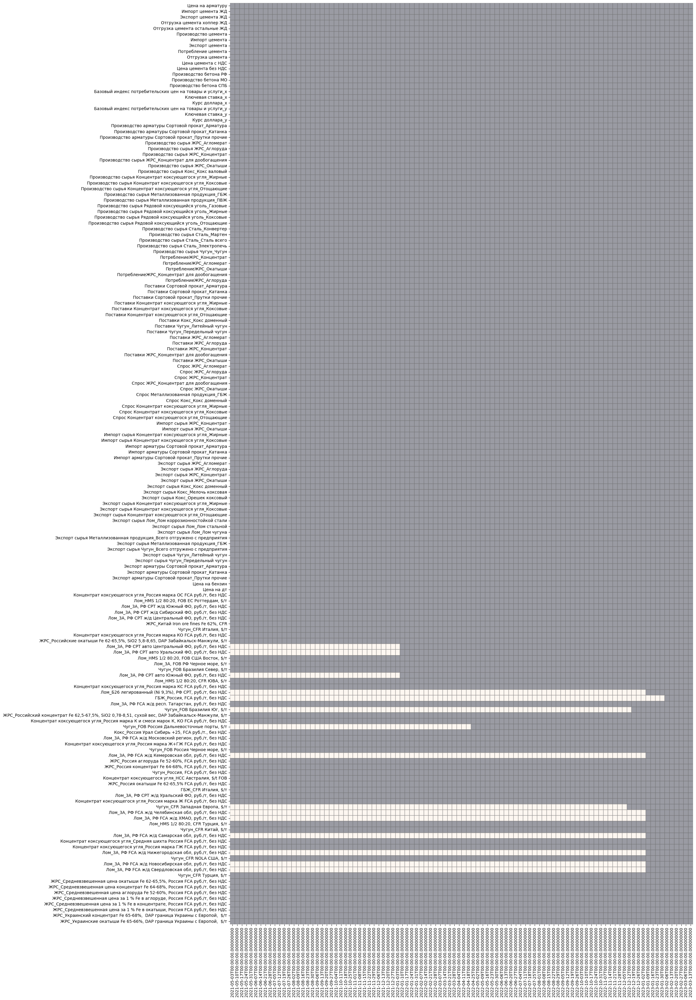

In [25]:
plt.figure(figsize=(20, 40)) 
sns.heatmap(df_cleaned.T.isnull(), cbar=False, linewidths=0.1, linecolor='gray', alpha=0.4)
plt.show()

In [26]:
df_cleaned.describe()

,Цена на арматуру,Импорт цемента ЖД,Экспорт цемента ЖД,Отгрузка цемента хоппер ЖД,Отгрузка цемента остальные ЖД,Производство цемента,Импорт цемента,Экспорт цемента,Потребление цемента,Отгрузка цемента,...,"Лом_3А, РФ FCA ж/д Свердловская обл, руб./т, без НДС","Чугун_CFR Турция, $/т","ЖРС_Средневзвешенная цена окатыши Fe 62-65,5%, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена концентрат Fe 64-68%, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена аглоруда Fe 52-60%, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена за 1 % Fe в аглоруде, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена за 1 % Fe в концентрате, Россия FCA руб./т, без НДС","ЖРС_Средневзвешенная цена за 1 % Fe в окатыши, Россия FCA руб./т, без НДС","ЖРС_Украинский концентрат Fe 65-68%, DAP граница Украины с Европой, $/т","ЖРС_Украинские окатыши Fe 65-66%, DAP граница Украины с Европой, $/т"
count,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,98.000000,...,10.000000,98.000000,98.000000,98.000000,98.00000,98.000000,98.000000,98.000000,98.000000,98.000000
mean,56971.428571,110.053259,79.978068,1623.872517,564.920874,5.162524,175.722123,95.050256,5.233205,2.188796,...,21682.500000,529.204082,9955.775510,7161.571429,3429.77551,64.061224,108.683673,158.591837,129.010204,181.806122
std,12069.532230,31.188802,27.155904,282.940423,226.955151,1.320490,55.698635,33.404362,1.400123,0.496419,...,2435.623181,106.348068,4313.979182,3019.695837,1070.57584,14.601805,46.223482,70.357824,40.539721,39.274978
min,40000.000000,40.751000,27.530000,987.540000,201.757000,2.389100,52.331737,31.491150,2.290941,1.189297,...,18353.000000,380.000000,4507.000000,3405.000000,1950.00000,39.000000,51.000000,71.000000,83.000000,132.500000
25%,45500.000000,91.806833,62.591840,1434.864031,353.186198,4.104000,138.242240,73.831853,4.136762,1.819546,...,19426.750000,430.625000,5042.000000,4221.000000,2578.75000,53.000000,64.000000,78.000000,98.875000,150.500000
50%,57400.000000,109.197625,76.262728,1717.032080,572.459822,5.481330,183.303744,87.916791,5.473761,2.312603,...,22351.500000,535.000000,10753.000000,6527.000000,3088.00000,63.000000,99.000000,172.000000,118.000000,163.500000
75%,66750.000000,124.813063,97.302300,1847.782977,756.984266,6.314781,213.623602,118.112080,6.549140,2.610070,...,23857.250000,593.625000,13189.000000,10279.000000,4420.00000,72.000000,158.000000,211.000000,146.000000,207.125000
max,79000.000000,182.082930,143.621000,1998.191000,989.297000,6.792200,280.405130,171.180400,6.938954,2.878493,...,24573.000000,804.000000,17343.000000,12649.000000,5581.00000,97.000000,192.000000,278.000000,218.000000,268.000000


In [27]:
df_cleaned.dropna(axis=1, inplace=True)


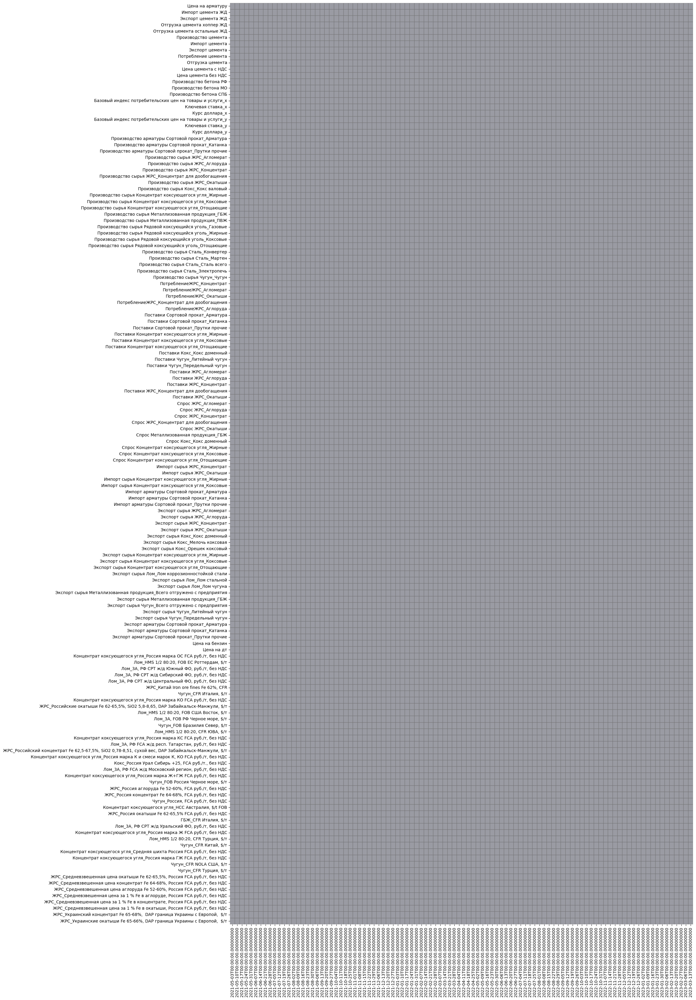

In [28]:
plt.figure(figsize=(20, 40)) 
sns.heatmap(df_cleaned.T.isnull(), cbar=False, linewidths=0.1, linecolor='gray', alpha=0.4)
plt.show()

In [29]:
df_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 98 entries, 2021-05-03 to 2023-03-13
Columns: 146 entries, Цена на арматуру to ЖРС_Украинские окатыши Fe 65-66%, DAP граница Украины с Европой,  $/т
dtypes: float64(145), int64(1)
memory usage: 114.6 KB


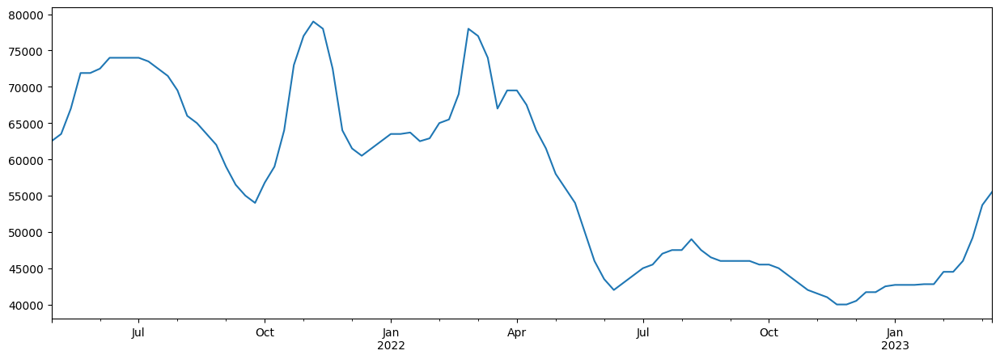

In [30]:
df_cleaned['Цена на арматуру'].plot(figsize=(15, 5))
plt.show()

In [ ]:
df

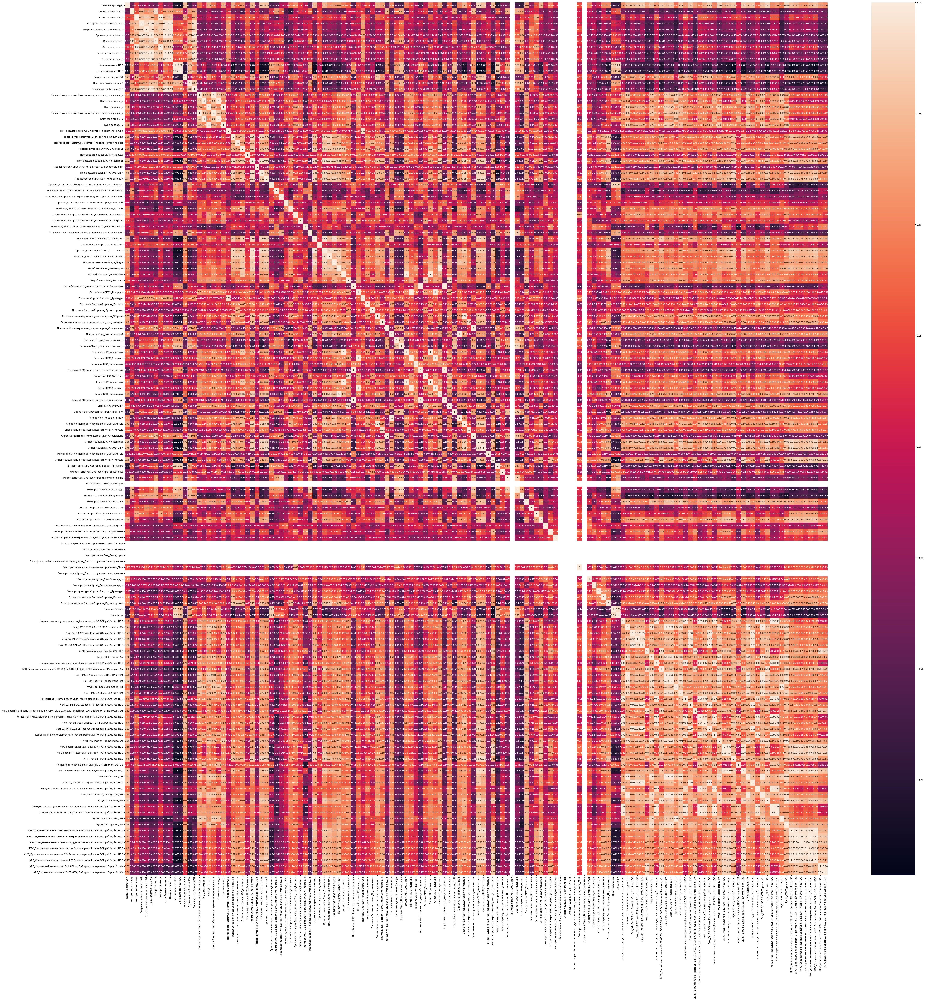

In [ ]:

def number_encode_features(init_df):
    result = init_df.copy()
    encoders = {}

    for column in result.columns:
        if result.dtypes[column] == object:
            encoders[column] = LabelEncoder()
            result[column] = encoders[column].fit_transform(result[column])
    return result, encoders

# %%
encoded_df, encoders = number_encode_features(df_cleaned)


corr_mat = encoded_df.corr()
plt.figure(figsize=[70, 70])
sns.heatmap(corr_mat, annot=True)
plt.show()

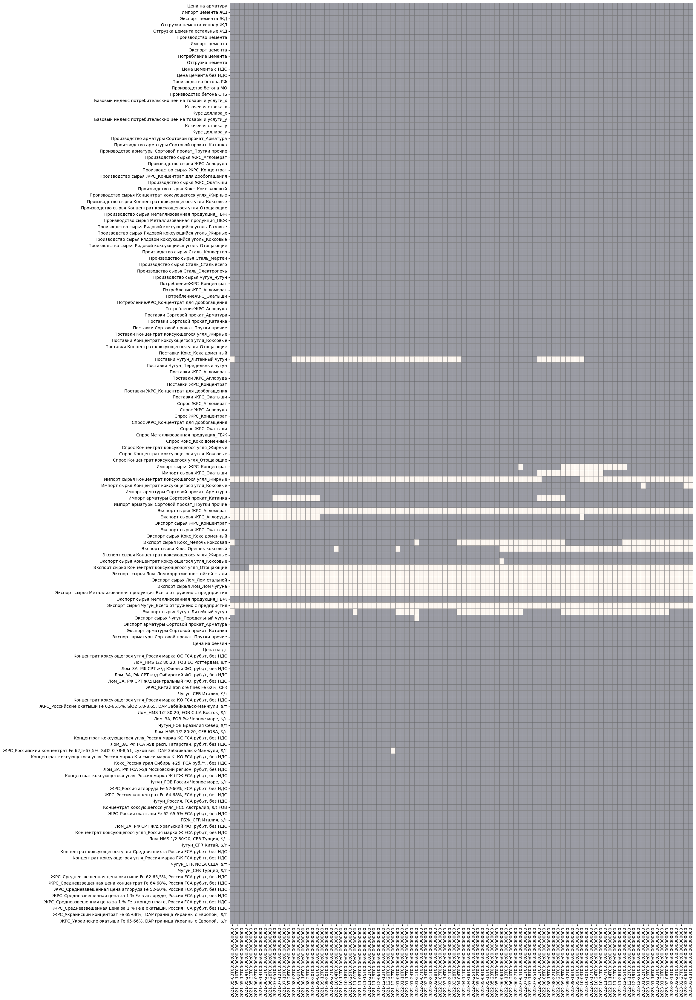

In [32]:
plt.figure(figsize=(20, 40)) 
sns.heatmap(df_cleaned.T==0, cbar=False, linewidths=0.1, linecolor='gray', alpha=0.4)
plt.show()

In [33]:
# df_cleaned = df_cleaned[(df_cleaned!=0).mean(axis=1) < 0.95]

df_cleaned = df_cleaned.loc[:, (df_cleaned == 0.0).mean() <= 0.8]

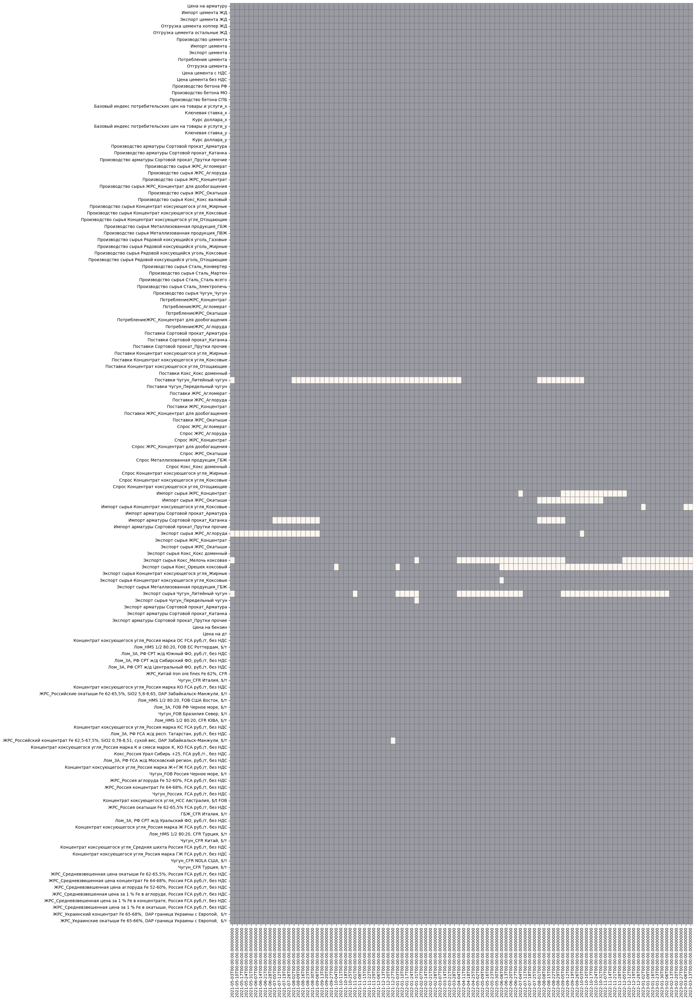

In [34]:
plt.figure(figsize=(20, 40)) 
sns.heatmap(df_cleaned.T==0, cbar=False, linewidths=0.1, linecolor='gray', alpha=0.4)
plt.show()

In [35]:
print(df_cleaned.iloc[:, 93].describe())

count    98.000000
mean     50.499082
std       1.288019
min      47.710000
25%      49.565000
50%      51.339000
75%      51.499000
max      51.680000
Name: Цена на бензин, dtype: float64


In [36]:


def check_stationarity(series):
    result = adfuller(series)
    print(f'ADF Statistic: {result[0]}')
    print(f'p-value: {result[1]}')
    for key, value in result[4].items():
        print(f'Critical Value ({key}): {value}')

check_stationarity(df_cleaned['Цена на арматуру'])  # Проверь целевую переменную


ADF Statistic: -2.1271051502672047
p-value: 0.23375606345581695
Critical Value (1%): -3.5003788874873405
Critical Value (5%): -2.8921519665075235
Critical Value (10%): -2.5830997960069446


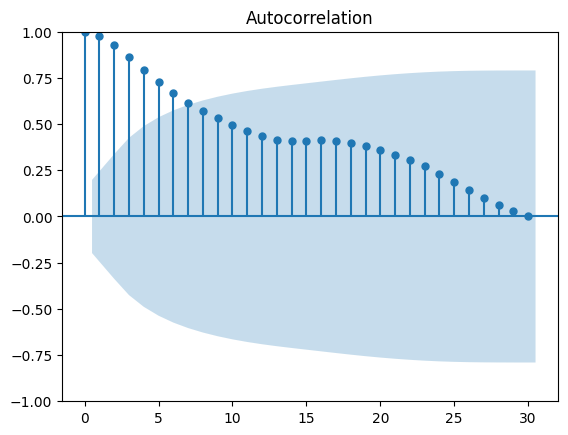

In [37]:

# Допустим, у тебя есть датафрейм df с колонкой 'price'
plot_acf(df_cleaned['Цена на арматуру'], lags=30)  # Смотрим автокорреляцию на 30 лагов
plt.show()

In [38]:
df_cleaned = df_cleaned.rename(columns={'Цена на арматуру':'price'})

df_cleaned['price_diff'] = df_cleaned['price'] - df_cleaned['price'].shift(1)
df_cleaned['price_seasonal_diff'] = df_cleaned['price'] - df_cleaned['price'].shift(12)
df_cleaned.dropna(inplace=True)  # Убираем NaN в начале

check_stationarity(df_cleaned['price_diff'])  # Проверь целевую переменную

ADF Statistic: -4.627431139671464
p-value: 0.0001149385896410928
Critical Value (1%): -3.5097356063504983
Critical Value (5%): -2.8961947486260944
Critical Value (10%): -2.5852576124567475


In [39]:
len(df_cleaned)

86

In [40]:


result = adfuller(df_cleaned['price_diff'].dropna())  # Тест на стационарность
print(f'ADF Statistic: {result[0]}')
print(f'p-value: {result[1]}')

if result[1] < 0.05:
    print("Ряд стационарен")
else:
    print("Ряд нестационарен, попробуйте другое преобразование")


ADF Statistic: -4.627431139671464
p-value: 0.0001149385896410928
Ряд стационарен


In [41]:
len(df_cleaned)

86

(68, 142) (18, 142)
['__abstractmethods__', '__annotations__', '__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattribute__', '__getstate__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__setstate__', '__sizeof__', '__sklearn_clone__', '__str__', '__subclasshook__', '__weakref__', '_abc_impl', '_build_request_for_signature', '_check_feature_names', '_check_n_features', '_doc_link_module', '_doc_link_template', '_doc_link_url_param_generator', '_estimator_type', '_get_default_requests', '_get_doc_link', '_get_metadata_request', '_get_param_names', '_get_params', '_get_tags', '_more_tags', '_replace_estimator', '_repr_html_', '_repr_html_inner', '_repr_mimebundle_', '_set_params', '_sklearn_auto_wrap_output_keys', '_validate_data', '_validate_names', '_validate_params', 'cv', 'fit', 'fit_transform', 'get_metadata

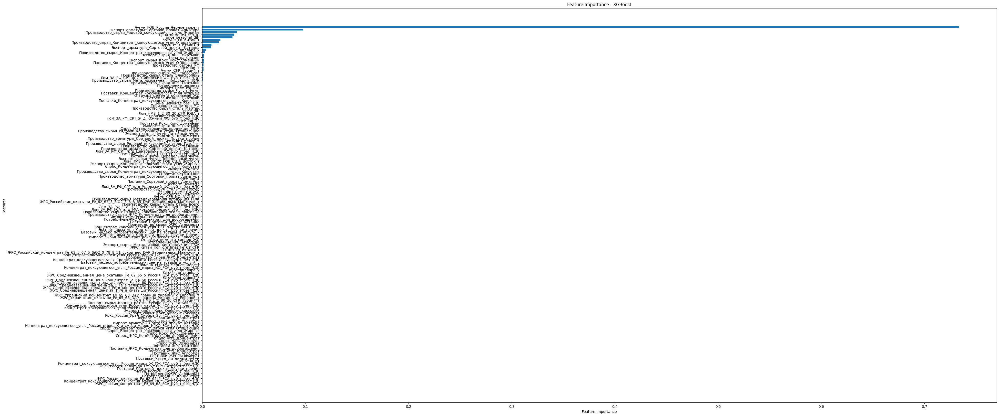

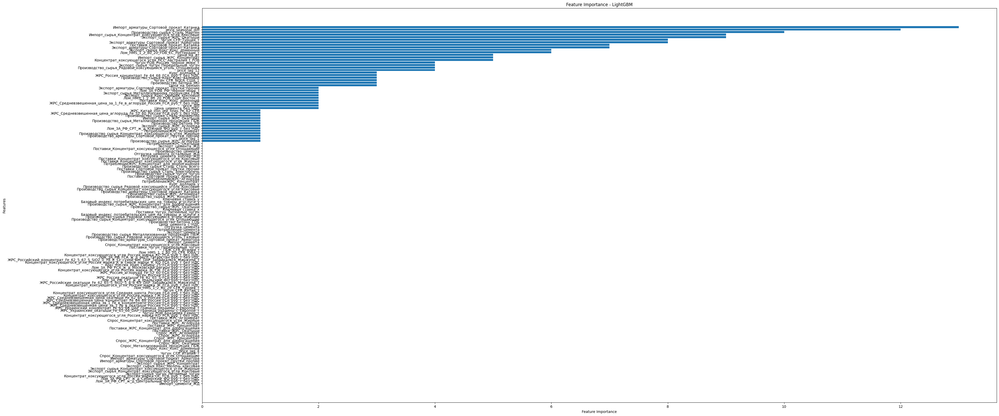

Удалено 43 признаков, оставлено 99 признаков.


In [ ]:

xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.08, random_state=42)
lgb_model = lgb.LGBMRegressor(n_estimators=100, learning_rate=0.08, random_state=42)



# Создаём стекинг-регрессор
stacking_model = StackingCVRegressor(
    regressors=[
        xgb.XGBRegressor(n_estimators=100, learning_rate=0.08, random_state=42),
        lgb.LGBMRegressor(n_estimators=100, learning_rate=0.08, random_state=42)], 
        meta_regressor=Ridge(alpha=1.0), cv=5
)
# Создаём базовые модели
# xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.08, random_state=42)
# lgb_model = lgb.LGBMRegressor(n_estimators=100, learning_rate=0.08, random_state=42)
# cat_model = cbt.CatBoostRegressor(iterations=50, learning_rate=0.08, depth=6, random_seed=42, verbose=100)



def create_lag_features(df, target_col, lags=[1, 4, 12]):
    for lag in lags:
        df[f'{target_col}_lag_{lag}'] = df[target_col].shift(lag)
    corr_threshold = 0.05
    lag_corr = df.corr()[target_col].abs()
    useful_lags = lag_corr[lag_corr > corr_threshold].index.tolist()
    return df[useful_lags]
# print(len(df_cleaned))
df = create_lag_features(df_cleaned, target_col='price', lags=[1, 4, 12])
df.fillna(df.median(), inplace=True)

# print(len(df))


train_size = int(len(df) * 0.8)
train_mod, test_mod = df.iloc[:train_size], df.iloc[train_size:]
X_train, y_train = train_mod.drop(columns=['price']), train_mod['price']
X_test, y_test = test_mod.drop(columns=['price']), test_mod['price']

print(X_train.shape, X_test.shape)

# Переименовываем столбцы, чтобы избежать проблем с JSON-символами
X_train.columns = X_train.columns.str.replace(r'\W+', '_', regex=True)
X_test.columns = X_test.columns.str.replace(r'\W+', '_', regex=True)











# Масштабирование
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

print(dir(stacking_model))



xgb_model.fit(X_train_scaled, y_train)
lgb_model.fit(X_train_scaled, y_train)


def get_feature_importance_df(model, feature_names, model_name):
    importance = model.feature_importances_
    sorted_idx = np.argsort(importance)

    plt.figure(figsize=(40, 20))
    plt.barh(np.array(feature_names)[sorted_idx], importance[sorted_idx])
    plt.xlabel("Feature Importance")
    plt.ylabel("Features")
    plt.title(f"Feature Importance - {model_name}")
    plt.show()
    return pd.DataFrame({'Feature': feature_names, f'{model_name}_Importance': importance})


xgb_importance = get_feature_importance_df(xgb_model, X_train.columns, "XGBoost")
lgb_importance = get_feature_importance_df(lgb_model, X_train.columns, "LightGBM")

importance_df = pd.merge(lgb_importance, xgb_importance, on='Feature', how='outer').fillna(0)

# Добавляем среднюю важность
importance_df['Average_Importance'] = (importance_df['LightGBM_Importance'] + importance_df['XGBoost_Importance']) / 2

# Фильтрация: признаки с нулевой важностью в обеих моделях
zero_importance = importance_df[(importance_df['LightGBM_Importance'] == 0) & 
                                (importance_df['XGBoost_Importance'] == 0)]

# Удаление нулевых признаков из тренировочных и тестовых данных
X_train_filtered = X_train.drop(columns=zero_importance['Feature'].values)
X_test_filtered = X_test.drop(columns=zero_importance['Feature'].values)

print(f"Удалено {len(zero_importance)} признаков, оставлено {X_train_filtered.shape[1]} признаков.")


# stacking_model.fit(
#     X_train_scaled, y_train,
    # eval_set=[(X_test_scaled, y_test)],  # Валидация на тестовых данных
    # verbose=True
# )

# lgb_model.fit(
#     X_train, y_train,
#     eval_set=[(X_test, y_test)]  # Валидация на тестовых данных
# )



# def plot_feature_importance(model, feature_names, model_name):
#     importance = model.feature_importances_
#     sorted_idx = np.argsort(importance)

#     plt.figure(figsize=(40, 20))
#     plt.barh(np.array(feature_names)[sorted_idx], importance[sorted_idx])
#     plt.xlabel("Feature Importance")
#     plt.ylabel("Features")
#     plt.title(f"Feature Importance - {model_name}")
#     plt.show()

# # Оценка важности признаков для каждой модели
# plot_feature_importance(stacking_model, X_train.columns, "XGBoost")
# plot_feature_importance(lgb_model, X_train.columns, "LightGBM")



# # Создаём стекинг-регрессор
# stacking_model = StackingRegressor(
#     estimators=[
#         ('xgb', xgb_model), 
#         ('lgb', lgb_model), 
#         # ('cat', cat_model)
#         ], final_estimator=Ridge(alpha=1.0
#     )  # Ridge-регрессия
# )





In [43]:
stacking_model.fit(X_train_filtered, y_train)
y_pred = stacking_model.predict(X_test_filtered)

print('-----------------------------------------------------------------------------------------------------------------------------------------')
mae = mean_absolute_error(y_test, y_pred)
print(f'MAE: {mae}')


print('-----------------------------------------------------------------------------------------------------------------------------------------')
r2 = r2_score(y_test, y_pred)
print(f"R^2: {r2}")

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000169 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1780
[LightGBM] [Info] Number of data points in the train set: 54, number of used features: 99
[LightGBM] [Info] Start training from score 58655.555556
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain

In [44]:
print(X_train.nunique().tolist())
print(X_train.iloc[:, 92].describe())


[68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 68, 66, 20, 68, 66, 20, 68, 68, 65, 58, 63, 56, 68, 64, 68, 66, 68, 67, 67, 61, 59, 68, 68, 68, 68, 68, 57, 68, 68, 67, 68, 60, 68, 67, 64, 67, 65, 64, 68, 66, 52, 66, 16, 54, 59, 65, 68, 66, 67, 59, 65, 68, 66, 67, 63, 66, 66, 66, 52, 52, 53, 59, 61, 32, 27, 44, 67, 66, 55, 32, 36, 62, 63, 24, 30, 61, 63, 65, 63, 64, 67, 11, 61, 68, 68, 68, 49, 47, 10, 57, 56, 55, 36, 45, 10, 68, 58, 9, 7, 68, 10, 43, 14, 17, 15, 58, 16, 47, 68, 7, 63, 35, 13, 9, 44, 46, 16, 16, 16, 15, 16, 14, 15, 16, 27, 56, 41, 42, 41]
count    68.000000
mean     50.634610
std       1.016546
min      48.452500
25%      49.776000
50%      51.315000
75%      51.420125
max      51.540000
Name: Цена_на_бензин, dtype: float64


In [45]:
import xgboost
print(xgboost.__version__)


3.0.0
